In [1]:
# Load libraries
import pandas as pd
import sklearn
from sklearn.ensemble import RandomForestClassifier 
from sklearn.model_selection import train_test_split 
from sklearn.naive_bayes import CategoricalNB, MultinomialNB
from sklearn.tree import export_graphviz
from sklearn.metrics import *
from kmodes.kmodes import KModes
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import numpy as np 

In [2]:
sklearn.__version__

'0.22.1'

In [3]:
sns.__version__

'0.10.0'

In [4]:
np.__version__

'1.18.1'

In [5]:
df=pd.read_csv('2 ANUPoll2018Data_CSV_01428.csv',na_values=' ')

In [6]:
df.shape

(2150, 134)

In [7]:
df.columns

Index(['srcid', 'IntDate', 'Mode', 'Q1_CF_Order', 'Q1', 'Q2', 'Q2_Oth', 'Q3',
       'Q3_Oth', 'Q4',
       ...
       'wt_volunteer', 'wt_design', 'wt_propensit', 'wt_base', 'wt_wave',
       'weight', 'StateMap', 'p_gender_sdc', 'p_age_group_sdc',
       'p_education_sdc'],
      dtype='object', length=134)

In [8]:
df.head()

,srcid,IntDate,Mode,Q1_CF_Order,Q1,Q2,Q2_Oth,Q3,Q3_Oth,Q4,...,wt_volunteer,wt_design,wt_propensit,wt_base,wt_wave,weight,StateMap,p_gender_sdc,p_age_group_sdc,p_education_sdc
0,32,14-OCT-18,2,2,2,19,NaN,16.0,NaN,3,...,1,4695.4258,1.114882,5276.692042,1067.142227,0.120183,1,2.0,3.0,1.0
1,275,09-OCT-18,2,2,2,11,NaN,12.0,NaN,1,...,1,4997.3515,1.052563,5302.078168,1135.761705,0.127911,1,2.0,4.0,1.0
2,1180,10-OCT-18,2,2,2,-99,NaN,NaN,NaN,3,...,2,16529.8031,1.052563,17537.751375,33341.543181,3.754958,1,2.0,3.0,3.0
3,1600,12-OCT-18,2,2,2,19,NaN,29.0,NaN,3,...,2,6108.6230,1.205618,7423.539862,5172.421973,0.582523,1,2.0,4.0,2.0
4,840,10-OCT-18,2,2,4,16,NaN,13.0,NaN,3,...,2,4997.3515,1.052563,5302.078168,3420.816221,0.385256,1,1.0,4.0,2.0


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2150 entries, 0 to 2149
Columns: 134 entries, srcid to p_education_sdc
dtypes: float64(68), int64(55), object(11)
memory usage: 2.2+ MB


In [10]:
df.shape

(2150, 134)

In [11]:
df.describe()

,srcid,Mode,Q1_CF_Order,Q1,Q2,Q3,Q4,Q5i_DUM,Q5a,Q5b,...,wt_volunteer,wt_design,wt_propensit,wt_base,wt_wave,weight,StateMap,p_gender_sdc,p_age_group_sdc,p_education_sdc
count,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2039.000000,2150.000000,2150.000000,2150.000000,2150.000000,...,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2146.000000,2108.000000,2077.000000
mean,1163.723721,1.880465,1.500465,2.687442,10.271163,16.110348,1.513953,1.751163,1.113023,1.283721,...,1.629767,6583.295398,1.340730,8965.073323,8879.338140,1.000000,2.697209,1.527027,2.823529,1.813192
std,692.746551,0.324492,0.500116,3.284123,29.989690,25.884341,34.576283,0.829278,9.167678,8.111397,...,0.482979,2526.578325,0.474094,4932.305826,10515.983360,1.184321,1.683119,0.499385,0.988388,0.832134
min,1.000000,1.000000,1.000000,-98.000000,-99.000000,-99.000000,-99.000000,1.000000,-99.000000,-99.000000,...,1.000000,3530.614600,1.052563,3745.903123,802.412409,0.090368,1.000000,1.000000,1.000000,1.000000
25%,572.250000,2.000000,1.000000,2.000000,4.000000,5.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,4997.351500,1.114882,5786.009589,1611.332079,0.181470,1.000000,1.000000,2.000000,1.000000
50%,1145.500000,2.000000,2.000000,2.000000,13.000000,13.000000,3.000000,2.000000,2.000000,2.000000,...,2.000000,6108.623000,1.205618,7423.539862,4934.730987,0.555754,2.000000,2.000000,3.000000,2.000000
75%,1715.750000,2.000000,2.000000,4.000000,17.000000,20.000000,4.000000,2.750000,2.000000,2.000000,...,2.000000,7573.640000,1.412872,10182.999412,11944.566179,1.345209,4.000000,2.000000,4.000000,3.000000
max,2615.000000,2.000000,2.000000,5.000000,96.000000,96.000000,97.000000,3.000000,4.000000,4.000000,...,2.000000,25556.162600,2.700689,29175.259286,93932.023240,10.578719,8.000000,2.000000,4.000000,3.000000


In [12]:
df.Q16.value_counts()

 3.0     389
 2.0     356
 1.0     174
 4.0     117
-98.0     37
-99.0      1
Name: Q16, dtype: int64

In [13]:
df.Q18.value_counts()

 3.0     486
 2.0     340
 1.0     135
 4.0      55
-98.0     50
-99.0      8
Name: Q18, dtype: int64

In [14]:
df.Q4.value_counts()

 3     650
 1     604
 4     327
-98    115
 2      86
 97     61
 6      60
 11     53
 5      49
 96     47
-99     32
 8      12
 95     12
 13      8
 16      6
 15      5
 17      4
 32      4
 24      4
 10      4
 20      2
 34      1
 28      1
 22      1
 39      1
 36      1
Name: Q4, dtype: int64

## Grouping up political parties based on political orientation

In [15]:
df.Q4=df.Q4.replace(1,"Centre-right").replace(2,"Centre-right")\
                        .replace(3,"Centre-left").replace(4,"Green").replace(5,"Other")\
                        .replace(6,"Centre-right").replace(7,"Centre").replace(8,"Centre-left")\
                        .replace(9,"Right-wing").replace(10,"Right-wing").replace(11,"Right-wing")\
                        .replace(13,"Right-wing").replace(14,"Right-wing").replace(15,"Right-wing")\
                        .replace(16,"Right-wing").replace(17,"Right-wing").replace(18,"Other")\
                        .replace(20,"Other").replace(22,"Right-wing").replace(23,"Right-wing")\
                        .replace(24,"Centre").replace(25,"Right-wing").replace(26,"Centre")\
                        .replace(27,"Right-wing").replace(28,"Centre").replace(29,"Right-wing")\
                        .replace(30,"Other").replace(31,"Other").replace(32,"Other")\
                        .replace(33,"Other").replace(34,"Centre").replace(35,"Centre")\
                        .replace(36,"Right-wing").replace(37,"Centre-left").replace(38,"Other")\
                        .replace(39,"Other").replace(95,"Swing").replace(96,"Independent")\
                        .replace(97,"No-party").replace(-98,"Undecided").replace(-99, "Refused'")

In [16]:
df.Q4

0        Centre-left
1       Centre-right
2        Centre-left
3        Centre-left
4        Centre-left
            ...     
2145    Centre-right
2146     Centre-left
2147     Centre-left
2148     Centre-left
2149     Centre-left
Name: Q4, Length: 2150, dtype: object

## I want to visualise the correlation between variables on a heatmap from a high-level

Before I dive into creating a ML model, I want to select some interesting variables first 

In [17]:
# Using One Hot Encoder to turn it into numerical values
enc = LabelEncoder()
df['Q4'] = enc.fit_transform(df['Q4']) 

In [18]:
plt.figure(figsize = (150,120))
sns.set(font_scale=1.8)

corr = df.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=False,
           cmap="cubehelix",
           cbar=False)
plt.show()

> The blank area shows the null values as the survey was split into two groups of people 

> Some variables seem to have higher correlations and will look at it into closer details 

# Creating a dataset for Module D 
Since respondents were split into two groupgs with one answering questions Q11 to Q15 (Module D) and another group answering questions Q16 to Q19 (Module E), it would make more sense to create two cohorts to analyse results

In [19]:
# I only selected the varialbes that I found more relevant for the dataset
module_d_master = df[['Q1','Q2','Q4','Q6a','Q6b','Q6c','Q6d','Q7a','Q7b','Q7c','Q7d','Q7e',\
                    'Q8a','Q8b','Q8c','Q8d','Q8e','Q8f','Q8g','Q8h',\
                    'Q10a','Q10b','Q10c','Q10d','Q11','Q12','Q13a','Q13b','Q13c',
                    'Q13d','Q13e','Q13f','Q14','Q15', \
                    'p_state','p_gender_sdc','p_age_group_sdc','p_education_sdc']]

In [20]:
module_d_master.columns

Index(['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q11', 'Q12', 'Q13a', 'Q13b', 'Q13c',
       'Q13d', 'Q13e', 'Q13f', 'Q14', 'Q15', 'p_state', 'p_gender_sdc',
       'p_age_group_sdc', 'p_education_sdc'],
      dtype='object')

In [21]:
module_d_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2150 entries, 0 to 2149
Data columns (total 38 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               2150 non-null   int64  
 1   Q2               2150 non-null   int64  
 2   Q4               2150 non-null   int64  
 3   Q6a              2150 non-null   int64  
 4   Q6b              2150 non-null   int64  
 5   Q6c              2150 non-null   int64  
 6   Q6d              2150 non-null   int64  
 7   Q7a              2150 non-null   int64  
 8   Q7b              2150 non-null   int64  
 9   Q7c              2150 non-null   int64  
 10  Q7d              2150 non-null   int64  
 11  Q7e              2150 non-null   int64  
 12  Q8a              2146 non-null   float64
 13  Q8b              2147 non-null   float64
 14  Q8c              2148 non-null   float64
 15  Q8d              2142 non-null   float64
 16  Q8e              2145 non-null   float64
 17  Q8f           

There are a lot of null values in the dataset and I will drop the null values. It is null because half of the respondents did not answer Q11-15

In [22]:
module_d_master = module_d_master.dropna()

In [23]:
module_d_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1011 entries, 1 to 2149
Data columns (total 38 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               1011 non-null   int64  
 1   Q2               1011 non-null   int64  
 2   Q4               1011 non-null   int64  
 3   Q6a              1011 non-null   int64  
 4   Q6b              1011 non-null   int64  
 5   Q6c              1011 non-null   int64  
 6   Q6d              1011 non-null   int64  
 7   Q7a              1011 non-null   int64  
 8   Q7b              1011 non-null   int64  
 9   Q7c              1011 non-null   int64  
 10  Q7d              1011 non-null   int64  
 11  Q7e              1011 non-null   int64  
 12  Q8a              1011 non-null   float64
 13  Q8b              1011 non-null   float64
 14  Q8c              1011 non-null   float64
 15  Q8d              1011 non-null   float64
 16  Q8e              1011 non-null   float64
 17  Q8f           

## Correlation Analysis on Module D data

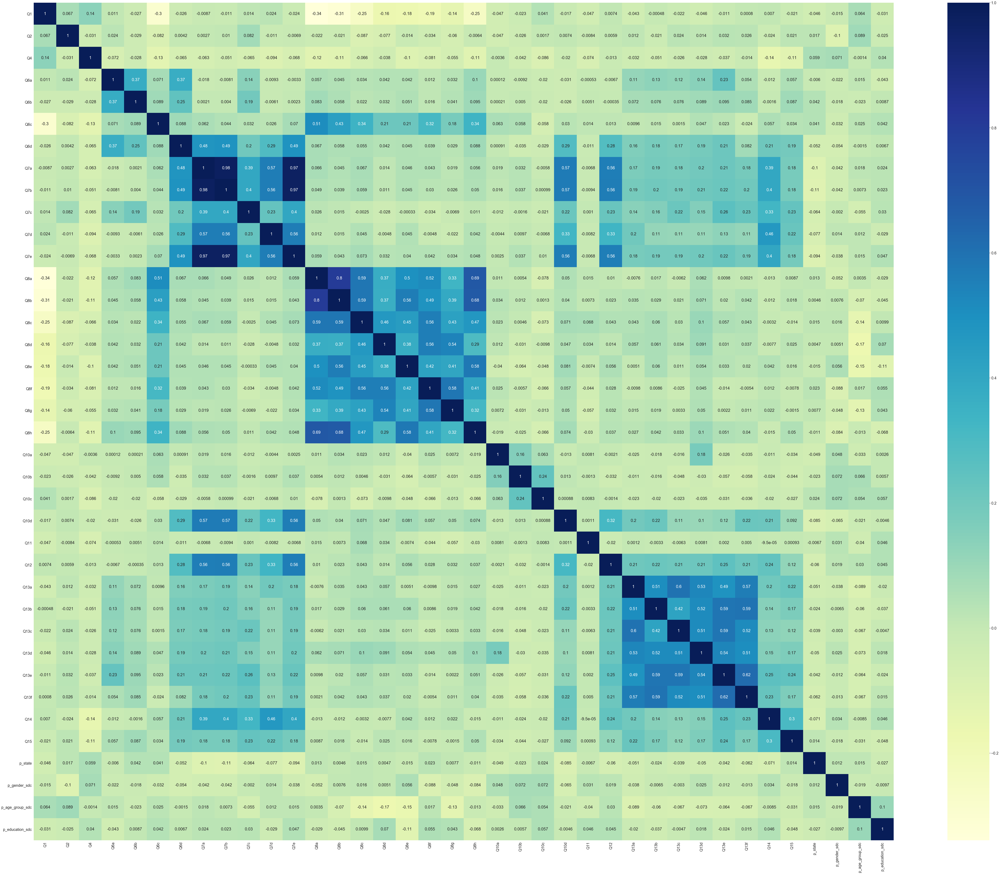

In [24]:
plt.figure(figsize = (100,80))
sns.set(font_scale=1.8)

corr = module_d_master.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=True,
           cmap="YlGnBu")
plt.show()

There seem to be some interesting relationships between some questions (shaded with darker colour). I will start with those variables for my ML model. 

Q11 does not have a strong correlation with most variables, but Q7a-e have a stronger correlation with Q10d, as well as Q12-Q14.

Questions of similar kinds (i.e. Question 6, 7, 8, 13) have a stronger correlation among each other.

## Random Forest on Module D

In [25]:
module_d_master.shape

(1011, 38)

In [26]:
module_d_cleaned = module_d_master

In [27]:
module_d_cleaned.Q11.value_counts()

 2.0     544
 3.0     244
 1.0     222
-98.0      1
Name: Q11, dtype: int64

For better results for this model, I decided to filter out the `I am undecided` and `Don't know` answers in Question 11.


In [28]:
module_d_cleaned = module_d_cleaned.loc[(module_d_cleaned["Q11"] !=-98.0) & (module_d_cleaned["Q11"] !=3.0)]

In [29]:
module_d_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 766 entries, 2 to 2149
Data columns (total 38 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               766 non-null    int64  
 1   Q2               766 non-null    int64  
 2   Q4               766 non-null    int64  
 3   Q6a              766 non-null    int64  
 4   Q6b              766 non-null    int64  
 5   Q6c              766 non-null    int64  
 6   Q6d              766 non-null    int64  
 7   Q7a              766 non-null    int64  
 8   Q7b              766 non-null    int64  
 9   Q7c              766 non-null    int64  
 10  Q7d              766 non-null    int64  
 11  Q7e              766 non-null    int64  
 12  Q8a              766 non-null    float64
 13  Q8b              766 non-null    float64
 14  Q8c              766 non-null    float64
 15  Q8d              766 non-null    float64
 16  Q8e              766 non-null    float64
 17  Q8f            

In [30]:
module_d_cleaned.Q11.value_counts()

2.0    544
1.0    222
Name: Q11, dtype: int64

In [31]:
# "I don't want a My Health Record and will opt out" responses have been grouped as 0, In favour &
# "I want a My Health Record" responses have been grouped as 1
module_d_cleaned.Q11 = module_d_cleaned.Q11.replace(1.0,0).replace(2.0,1)

/Users/wtong/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [32]:
module_d_cleaned.Q11.value_counts()

1.0    544
0.0    222
Name: Q11, dtype: int64

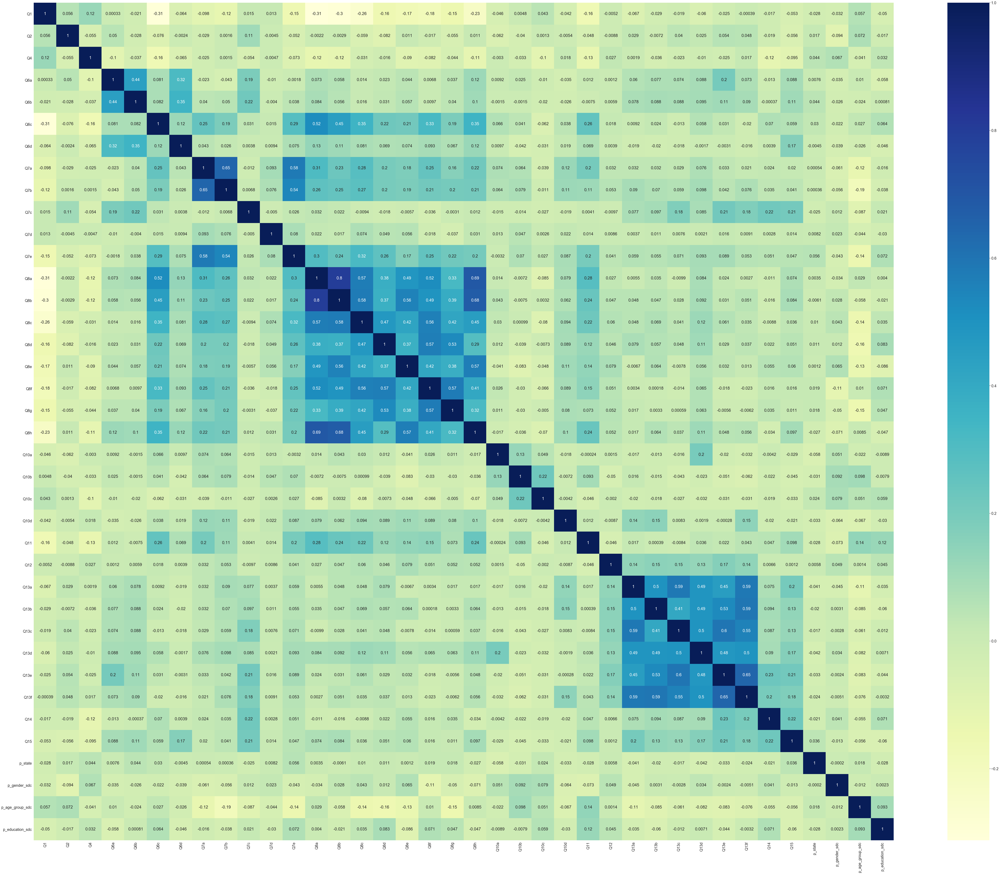

In [33]:
plt.figure(figsize = (100,80))
sns.set(font_scale=1.8)

corr = module_d_cleaned.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=True,
           cmap="YlGnBu")
plt.show()

This is interesting - Aftering removing the undecided responses in Q11 has a higher correlation with Q6c, Q7a and Q8  than before, but Q6 and 7 now have a lower correlation with Q13.

In [34]:
module_d_cleaned.columns

Index(['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q11', 'Q12', 'Q13a', 'Q13b', 'Q13c',
       'Q13d', 'Q13e', 'Q13f', 'Q14', 'Q15', 'p_state', 'p_gender_sdc',
       'p_age_group_sdc', 'p_education_sdc'],
      dtype='object')

### Data cleaning - Turning categorical data into dummy variables
In order to use sklearn package, I will need to encode all the categorical data. 

In [35]:
# One-hot encode the data using pandas get_dummies
features_rf_d = pd.get_dummies(module_d_cleaned, columns=['Q1','Q2','Q4','Q6a','Q6b','Q6c','Q6d','Q7a','Q7b','Q7c','Q7d','Q7e',\
                    'Q8a','Q8b','Q8c','Q8d','Q8e','Q8f','Q8g','Q8h',\
                    'Q10a','Q10b','Q10c','Q10d','Q12',\
                    'Q13a', 'Q13b', 'Q13c','Q13d', 'Q13e', 'Q13f','Q14','Q15', \
                    'p_state','p_gender_sdc','p_age_group_sdc','p_education_sdc'], drop_first=False)


In [36]:
features_rf_d.columns

Index(['Q11', 'Q1_1', 'Q1_2', 'Q1_3', 'Q1_4', 'Q1_5', 'Q2_-99', 'Q2_-98',
       'Q2_-96', 'Q2_1',
       ...
       'p_state_8', 'p_gender_sdc_1.0', 'p_gender_sdc_2.0',
       'p_age_group_sdc_1.0', 'p_age_group_sdc_2.0', 'p_age_group_sdc_3.0',
       'p_age_group_sdc_4.0', 'p_education_sdc_1.0', 'p_education_sdc_2.0',
       'p_education_sdc_3.0'],
      dtype='object', length=257)

In [37]:
features_rf_d.iloc[:,5:].head(5)

,Q1_5,Q2_-99,Q2_-98,Q2_-96,Q2_1,Q2_2,Q2_4,Q2_5,Q2_6,Q2_7,...,p_state_8,p_gender_sdc_1.0,p_gender_sdc_2.0,p_age_group_sdc_1.0,p_age_group_sdc_2.0,p_age_group_sdc_3.0,p_age_group_sdc_4.0,p_education_sdc_1.0,p_education_sdc_2.0,p_education_sdc_3.0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
12,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
13,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0


In [38]:
features_rf_d.Q11.value_counts()

1.0    544
0.0    222
Name: Q11, dtype: int64

In [39]:
# Setting Q11 as the target variable
target_rf_d = np.array(features_rf_d['Q11'])


In [40]:
# Remove the labels from the features
# axis 1 refers to the columns
features_rf_d= features_rf_d.drop(['Q11'], axis = 1)

In [41]:
feature_list_rf = list(features_rf_d.columns)

In [42]:
# Convert to numpy array
features_rf_d = np.array(features_rf_d)

In [43]:
# Using sklearn package train_test_split to train my model. I also set the randomness to 0 so that whenever I run
# the model it will return the same result instead of generating a different result. 
train_x, test_x, train_y, test_y = train_test_split(features_rf_d, target_rf_d, test_size = 0.30, random_state = 42)

In [44]:
print('Training Features Shape:', train_x.shape)
print('Training Target Shape:', train_y.shape)
print('Testing Features Shape:', test_x.shape)
print('Testing Target Shape:', test_y.shape)

Training Features Shape: (536, 256)
Training Target Shape: (536,)
Testing Features Shape: (230, 256)
Testing Target Shape: (230,)


In [45]:
#Create a RandomForestClassifier using gini index
clf_rf_d=RandomForestClassifier(n_estimators=500,criterion = "gini", bootstrap=False,random_state = 42)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_rf_d.fit(train_x,train_y)


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [46]:
# Use the forest's predict method on the test data
prediction_y = clf_rf_d.predict(test_x)

In [47]:
# Calculate the absolute errors
errors = abs(prediction_y - test_y)

In [48]:
confusion_matrix(test_y,prediction_y)

array([[ 16,  43],
       [ 12, 159]])

In [49]:
tn, fp, fn, tp = confusion_matrix(test_y, prediction_y).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)


True Positive: 159
False Negative: 12
False Positive: 43
True Negative: 16


In [50]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(test_y, prediction_y),3)*100,"%")
print("Recall:", recall_score(test_y, prediction_y, average = None))
print("Precision:",precision_score(test_y, prediction_y, average = None))
print("F1 Score:",f1_score(test_y, prediction_y, average=None))

Mean Absolute Error: 23.9 %
Accuracy: 76.1 %
Recall: [0.27118644 0.92982456]
Precision: [0.57142857 0.78712871]
F1 Score: [0.36781609 0.85254692]


In [51]:
target_names = ['Against', 'For']

In [52]:
print(classification_report(test_y, prediction_y, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.57      0.27      0.37        59
         For       0.79      0.93      0.85       171

    accuracy                           0.76       230
   macro avg       0.68      0.60      0.61       230
weighted avg       0.73      0.76      0.73       230



Now I want to check the importance of each feature

In [53]:
feature_imp = pd.Series(clf_rf_d.feature_importances_,index=feature_list_rf).sort_values(ascending=False)
feature_imp

Q6b_1         0.016470
Q14_1.0       0.014517
Q7e_1         0.013959
Q10d_1        0.013361
Q8c_1.0       0.012380
                ...   
Q10d_-99      0.000000
Q8d_10.0      0.000000
Q12_-98.0     0.000000
Q4_0          0.000000
Q13a_-99.0    0.000000
Length: 256, dtype: float64

Seems like there are a lot of records that have no importance

In [54]:
feature_imp[feature_imp >0]

Q6b_1         0.016470
Q14_1.0       0.014517
Q7e_1         0.013959
Q10d_1        0.013361
Q8c_1.0       0.012380
                ...   
Q13b_-99.0    0.000016
Q10c_-98      0.000012
Q7d_-98       0.000012
Q6b_-98       0.000009
Q7c_-99       0.000006
Length: 250, dtype: float64

Still too many records for my next iteration. Now I want to find records that have importance higher than 0.01

In [55]:
feature_imp[feature_imp >=0.01]

Q6b_1                  0.016470
Q14_1.0                0.014517
Q7e_1                  0.013959
Q10d_1                 0.013361
Q8c_1.0                0.012380
p_age_group_sdc_2.0    0.011270
Q6c_2                  0.010797
Q4_3                   0.010419
dtype: float64

## Cluster Analysis using Kmode

In [56]:
module_d_cleaned.Q11.value_counts()

1.0    544
0.0    222
Name: Q11, dtype: int64

In [57]:
d_cluster = module_d_cleaned

In [58]:
d_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 766 entries, 2 to 2149
Data columns (total 38 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               766 non-null    int64  
 1   Q2               766 non-null    int64  
 2   Q4               766 non-null    int64  
 3   Q6a              766 non-null    int64  
 4   Q6b              766 non-null    int64  
 5   Q6c              766 non-null    int64  
 6   Q6d              766 non-null    int64  
 7   Q7a              766 non-null    int64  
 8   Q7b              766 non-null    int64  
 9   Q7c              766 non-null    int64  
 10  Q7d              766 non-null    int64  
 11  Q7e              766 non-null    int64  
 12  Q8a              766 non-null    float64
 13  Q8b              766 non-null    float64
 14  Q8c              766 non-null    float64
 15  Q8d              766 non-null    float64
 16  Q8e              766 non-null    float64
 17  Q8f            

In [59]:
d_cluster.shape

(766, 38)

In [60]:
d_cluster_a = pd.get_dummies(d_cluster, columns=['Q1','Q2','Q4','Q6a','Q6b','Q6c','Q6d','Q7a','Q7b','Q7c','Q7d','Q7e',\
                    'Q8a','Q8b','Q8c','Q8d','Q8e','Q8f','Q8g','Q8h',\
                    'Q10a','Q10b','Q10c','Q10d','Q11',
                     'Q13a', 'Q13b', 'Q13c','Q13d', 'Q13e', 'Q13f', 'Q12','Q14','Q15', \
                    'p_state','p_gender_sdc','p_age_group_sdc','p_education_sdc'], drop_first=False)

In [61]:
cost = []
# In my first iteration, I will start witth 10 clusters and see how things go
for num_clusters in list(range(1,11)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 10, verbose=1)
    clusters = kmode.fit_predict(d_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 27636.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 167, cost: 26108.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 211, cost: 25486.0
Run 1, iteration: 2/100, moves: 84, cost: 25431.0
Run 1, iteration: 3/100, moves: 36, cost: 25431.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 183, cost: 25246.0
Run 1, iteration: 2/100, moves: 89, cost: 25112.0
Run 1, iteration: 3/100,

In [62]:
# Checking to see what the cost is like. Cost is interpreted as the sum of distances between each data point
# within the cluster
cost

[27636.0,
 26108.0,
 25431.0,
 25095.0,
 24624.0,
 24342.0,
 24161.0,
 24009.0,
 23864.0,
 23625.0]

Text(0.5, 1.0, 'Elbow Method')

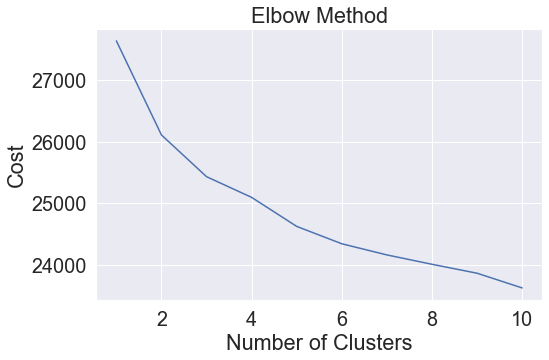

In [63]:
number_k = np.array([i for i in range(1,11)])

plt.figure(figsize = (8,5))
plt.plot(number_k,cost)
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.title('Elbow Method')

It looks like I should set k to 4 to optimise this model 

In [64]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in d_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q11_1.0
Q13a_1.0
Q13b_1.0
Q13c_2.0
Q13d_1.0
Q13e_2.0
Q13f_2.0
Q15_3.0
p_gender_sdc_2.0
p_education_sdc_1.0

cluster 1: 
Q1_2
Q7a_2
Q7b_2
Q7d_2
Q7e_2
Q10a_2
Q10b_4
Q10c_2
Q10d_2
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q12_2.0
Q14_2.0
Q15_3.0
p_gender_sdc_1.0

cluster 2: 
Q4_2
Q8d_1.0
Q10a_5
Q10b_5
Q10c_5
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q15_3.0
p_gender_sdc_2.0

cluster 3: 
Q1_4
Q6a_1
Q6b_1
Q6c_1
Q6d_1
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8a_1.0
Q8b_1.0
Q8c_1.0
Q8d_1.0
Q8f_1.0
Q8g_1.0
Q10b_5
Q10c_5
Q10d_1
Q11_0.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
p_gender_sdc_2.0

cluster 4: 
Q1_2
Q4_2
Q6a_4
Q6c_4
Q11_1.0
Q13a_2.0
Q13b_1.0
Q13c_2.0
Q13d_2.0
Q13e_1.0
Q13f_2.0
Q14_2.0
Q15_3.0
p_gender_sdc_1.0
p_age_group_sdc_4.0

cluster 5: 
Q1_2
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8d_1.0
Q10c_4
Q10d_2
Q11_0.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q12_2.0
p_gender_sdc_1.0
p_age_group_sdc_3.0

cluste

In [65]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(d_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)



For n_clusters = 10 The average silhouette_score is : 0.014149716101877173


The silhoutte score is not negative but is rather low. Let me results the number of clusters and see if the score increases.

In [66]:
cost = []
# Setting k to 4
for num_clusters in list(range(1,5)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 10, verbose=1)
    clusters = kmode.fit_predict(d_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 27636.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 167, cost: 26108.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 211, cost: 25486.0
Run 1, iteration: 2/100, moves: 84, cost: 25431.0
Run 1, iteration: 3/100, moves: 36, cost: 25431.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 183, cost: 25246.0
Run 1, iteration: 2/100, moves: 89, cost: 25112.0
Run 1, iteration: 3/100,

In [67]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in d_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q11_1.0
Q13a_1.0
Q13b_1.0
Q13c_2.0
Q13d_1.0
Q13e_2.0
Q13f_2.0
Q15_3.0
p_gender_sdc_2.0
p_education_sdc_1.0

cluster 1: 
Q1_2
Q7a_2
Q7b_2
Q7c_2
Q7d_2
Q7e_2
Q10a_2
Q10b_4
Q10d_2
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q12_2.0
Q14_2.0
Q15_3.0
p_gender_sdc_1.0

cluster 2: 
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q14_3.0
Q15_3.0
p_gender_sdc_2.0

cluster 3: 
Q1_4
Q6b_1
Q6c_1
Q6d_1
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8c_1.0
Q8d_1.0
Q8f_1.0
Q8g_1.0
Q10d_1
Q11_0.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
p_gender_sdc_1.0


In [68]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(d_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)



For n_clusters = 4 The average silhouette_score is : 0.021555780290233913


The silhouette score improved but it is still rather low probably due to high sparsity in data. Let me try setting k to 2 and see if the scrore improves

In [69]:
cost = []
# Setting k to 2
for num_clusters in list(range(1,3)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 10, verbose=1)
    clusters = kmode.fit_predict(d_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 27636.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 167, cost: 26108.0


In [70]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in d_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q11_1.0
Q13a_1.0
Q13b_1.0
Q13c_2.0
Q13d_1.0
Q13e_2.0
Q13f_2.0
Q15_3.0
p_gender_sdc_2.0
p_education_sdc_1.0

cluster 1: 
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q12_2.0
p_gender_sdc_1.0


In [71]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(d_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)



For n_clusters = 2 The average silhouette_score is : 0.030981578979599012


In fact, setting k to 2 improves the score! 

>Juding from the Elbow method and silhouette score, setting number of clusters to `2` is the most optimal option. But we lose a lot of interesting information from the clusters. I will go with k = 4 to retain importance information.

## Naive Bayes

In [72]:
# I only selected the varialbes that I found more relevant for the dataset
df_d_nb = module_d_cleaned

To use the sklearn library to conduce Naive Bayes analysis, I will need to turn all numbers in the dataset into positive values. I will use lambda function to make it happen.

In [73]:
df_d_nb = df_d_nb.apply(lambda x:abs(x))

In [74]:
df_d_nb.Q6b.value_counts()

2     225
3     202
4     142
1     125
5      68
98      4
Name: Q6b, dtype: int64

In [75]:
df_d_nb.Q11.value_counts()

1.0    544
0.0    222
Name: Q11, dtype: int64

In [76]:
df_d_nb.Q12.value_counts()

2.0     334
3.0     244
1.0     106
4.0      80
98.0      2
Name: Q12, dtype: int64

Looks good, all values are positive now. 

In [77]:
df_d_nb.shape

(766, 38)

In [78]:
df_d_nb.columns

Index(['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q11', 'Q12', 'Q13a', 'Q13b', 'Q13c',
       'Q13d', 'Q13e', 'Q13f', 'Q14', 'Q15', 'p_state', 'p_gender_sdc',
       'p_age_group_sdc', 'p_education_sdc'],
      dtype='object')

In [79]:
features_nb_d = df_d_nb[['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q12', 
        'Q13a', 'Q13b', 'Q13c','Q13d', 'Q13e', 'Q13f', 'Q14', 'Q15', 'p_state',
       'p_gender_sdc', 'p_age_group_sdc', 'p_education_sdc'
            ]] 

In [80]:
target_nb_d = df_d_nb['Q11'] 

In [81]:
X_train, X_test, y_train, y_test = train_test_split(features_nb_d, target_nb_d, test_size=0.30, random_state=42)

In [82]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [83]:
prediction_nb = model_nb.predict(X_test)

In [84]:
errors = abs(prediction_nb - y_test)

In [85]:
confusion_matrix(y_test, prediction_nb)

array([[  9,  50],
       [ 18, 153]])

In [86]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 153
False Negative: 18
False Positive: 50
True Negative: 9


In [87]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 29.599999999999998 %
Accuracy: 70.39999999999999 %
Recall: [0.15254237 0.89473684]
Precision: [0.33333333 0.75369458]
F1 Score: [0.20930233 0.81818182]


In [88]:
target_names = ['Against','For']

In [89]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.33      0.15      0.21        59
         For       0.75      0.89      0.82       171

    accuracy                           0.70       230
   macro avg       0.54      0.52      0.51       230
weighted avg       0.65      0.70      0.66       230



The accuracy rate is alright, I want to have an accuracy to at least `70%`. Let me remove some features and see if the rate improves. 

### Second iteration using Naive Bayes. Only using Q1,2,4, p_gender_sdc, p_age_group_sdc, p_education_sdc, i.e. the background of respondents and general opinions. 

In [90]:
features_nb_d_a = df_d_nb[['Q1', 'Q2', 'Q4','p_state','p_gender_sdc', 'p_age_group_sdc', 'p_education_sdc']] 


In [91]:
target_nb_d_a = df_d_nb['Q11'] 

In [92]:
X_train, X_test, y_train, y_test = train_test_split(features_nb_d_a, target_nb_d_a, test_size=0.30, random_state=42)

In [93]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [94]:
prediction_nb = model_nb.predict(X_test)

In [95]:
errors = abs(prediction_nb - y_test)

In [96]:
confusion_matrix(y_test, prediction_nb)

array([[ 10,  49],
       [  7, 164]])

In [97]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 164
False Negative: 7
False Positive: 49
True Negative: 10


In [98]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 24.3 %
Accuracy: 75.7 %
Recall: [0.16949153 0.95906433]
Precision: [0.58823529 0.76995305]
F1 Score: [0.26315789 0.85416667]


In [99]:
target_names = ['Against','For']

In [100]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.59      0.17      0.26        59
         For       0.77      0.96      0.85       171

    accuracy                           0.76       230
   macro avg       0.68      0.56      0.56       230
weighted avg       0.72      0.76      0.70       230



The accuracy rate and precision improved. But I also want to evaluate how respondents' opinions on privacy matters affect prediction of Q11.

### Third iteration - using opinions on privacy as features

In [101]:
features_nb_d_b = df_d_nb[['Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q12', 
         'Q13a', 'Q13b', 'Q13c','Q13d', 'Q13e', 'Q13f','Q14', 'Q15', 
            ]] 

In [102]:
target_nb_d_b = df_d_nb['Q11'] 

In [103]:
X_train, X_test, y_train, y_test = train_test_split(features_nb_d_b, target_nb_d_b, test_size=0.30, random_state=42)

In [104]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [105]:
prediction_nb = model_nb.predict(X_test)

In [106]:
errors = abs(prediction_nb - y_test)

In [107]:
confusion_matrix(y_test, prediction_nb)

array([[  7,  52],
       [ 18, 153]])

In [108]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 153
False Negative: 18
False Positive: 52
True Negative: 7


In [109]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 30.4 %
Accuracy: 69.6 %
Recall: [0.11864407 0.89473684]
Precision: [0.28       0.74634146]
F1 Score: [0.16666667 0.81382979]


In [110]:
target_names = ['Against','For']

In [111]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.28      0.12      0.17        59
         For       0.75      0.89      0.81       171

    accuracy                           0.70       230
   macro avg       0.51      0.51      0.49       230
weighted avg       0.63      0.70      0.65       230



Interestingly, although the accuracy rate improves from the first itteation, it is worse than the second iteration. 
>It seems like respondents' background, political orientation and general views matter for than concerns about privacy w.r.t their attitude on whether or to have health records available online.

# Creating a dataset for Module E 

In [112]:
df_module_e_master = df[['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b',
                    'Q7c', 'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g',
                    'Q8h', 'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q16', 'Q17a', 'Q17b', 'Q17c',
                    'Q17d', 'Q17e', 'Q17f', 'Q18', 'Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e',
                    'Q19f', 'Q19g', 'p_state', 'p_gender_sdc', 'p_age_group_sdc',
                    'p_education_sdc']]

In [113]:
df_module_e_master.Q4.value_counts()

2     750
1     662
3     327
10    115
8      82
5      61
6      56
4      47
7      32
9      12
0       6
Name: Q4, dtype: int64

In [114]:
df_module_e_master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2150 entries, 0 to 2149
Data columns (total 43 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               2150 non-null   int64  
 1   Q2               2150 non-null   int64  
 2   Q4               2150 non-null   int64  
 3   Q6a              2150 non-null   int64  
 4   Q6b              2150 non-null   int64  
 5   Q6c              2150 non-null   int64  
 6   Q6d              2150 non-null   int64  
 7   Q7a              2150 non-null   int64  
 8   Q7b              2150 non-null   int64  
 9   Q7c              2150 non-null   int64  
 10  Q7d              2150 non-null   int64  
 11  Q7e              2150 non-null   int64  
 12  Q8a              2146 non-null   float64
 13  Q8b              2147 non-null   float64
 14  Q8c              2148 non-null   float64
 15  Q8d              2142 non-null   float64
 16  Q8e              2145 non-null   float64
 17  Q8f           

In [115]:
# Dropping null values
df_module_e_master = df_module_e_master.dropna()

In [116]:
df_module_e_master.shape

(992, 43)

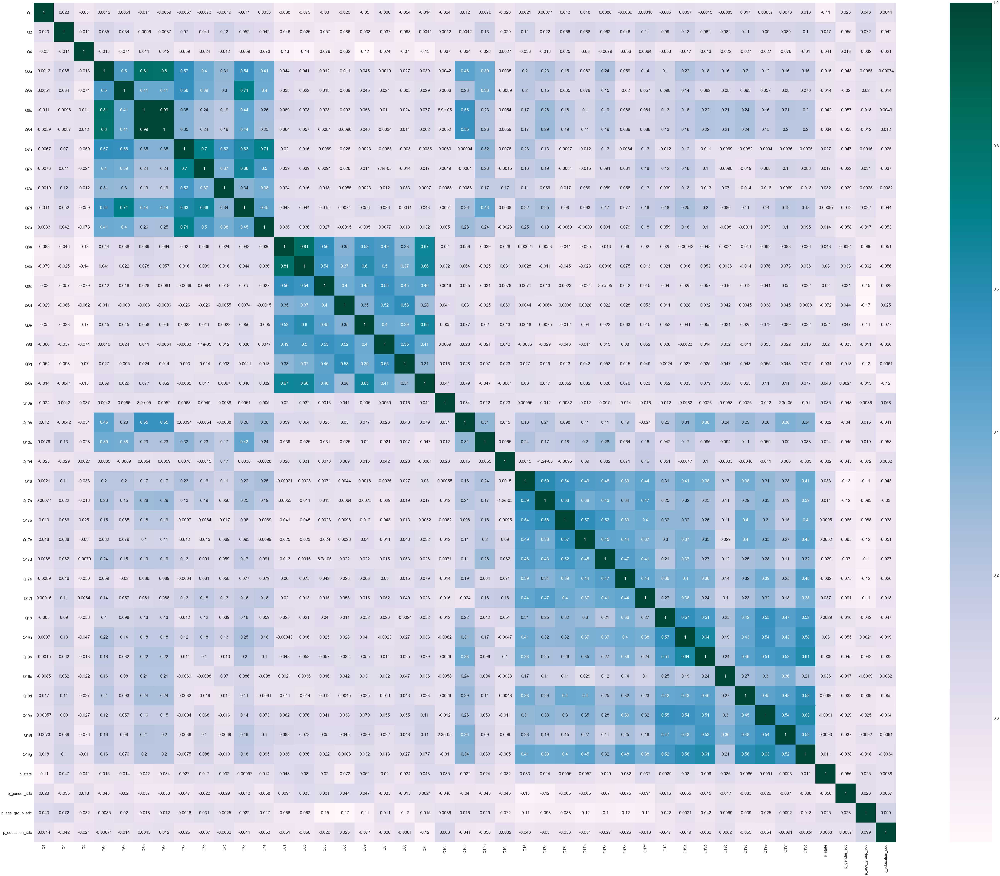

In [117]:
plt.figure(figsize = (100,80))
sns.set(font_scale=1.8)

corr = df_module_e_master.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=True,
           cmap="PuBuGn")
plt.show()

Just like Module D, for questions from the same categories, such as Q6,7,8,10,18,18, the correlations are strong. 

I want to look at Q16 and Q18. For Q 16, it appears that it has some strong correlations with Q6, 17, 18 and 19. However, since Q17 is simply an extension of Q16, I might want to exclude Q17 when evaluating the independent variables. Same for Q18, given that Q19 is an extension of Q18, I will also exclude Q19 when evaluating Q18. 


### Firstly, I will evaluate Q16

In [118]:
df_module_e_master.Q16.value_counts()

 3.0     360
 2.0     336
 1.0     156
 4.0     106
-98.0     33
-99.0      1
Name: Q16, dtype: int64

In [119]:
module_e_cleaned_16 = df_module_e_master

In [120]:
module_e_cleaned_16.Q16.value_counts()

 3.0     360
 2.0     336
 1.0     156
 4.0     106
-98.0     33
-99.0      1
Name: Q16, dtype: int64

I want to exclude the non-responses to make my model more accurate. 

In [121]:
module_e_cleaned_16 = module_e_cleaned_16.loc[(module_e_cleaned_16["Q16"] !=-98.0) & (module_e_cleaned_16["Q16"] !=-99.0)]

In [122]:
module_e_cleaned_16.Q16.value_counts()

3.0    360
2.0    336
1.0    156
4.0    106
Name: Q16, dtype: int64

I also want to group up granular opinions.

In [123]:
# Strongly against & Against have been grouped as 0, In favour & Strongly in favour have been grouped as 1
module_e_cleaned_16.Q16 = module_e_cleaned_16.Q16.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1) 

/Users/wtong/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [124]:
module_e_cleaned_16.Q16.value_counts()

0.0    492
1.0    466
Name: Q16, dtype: int64

In [125]:
module_e_cleaned_16.shape

(958, 43)

In [126]:
module_e_cleaned_16.Q4.value_counts()

2     333
1     290
3     146
10     50
8      42
6      31
5      24
4      21
7      13
9       4
0       4
Name: Q4, dtype: int64

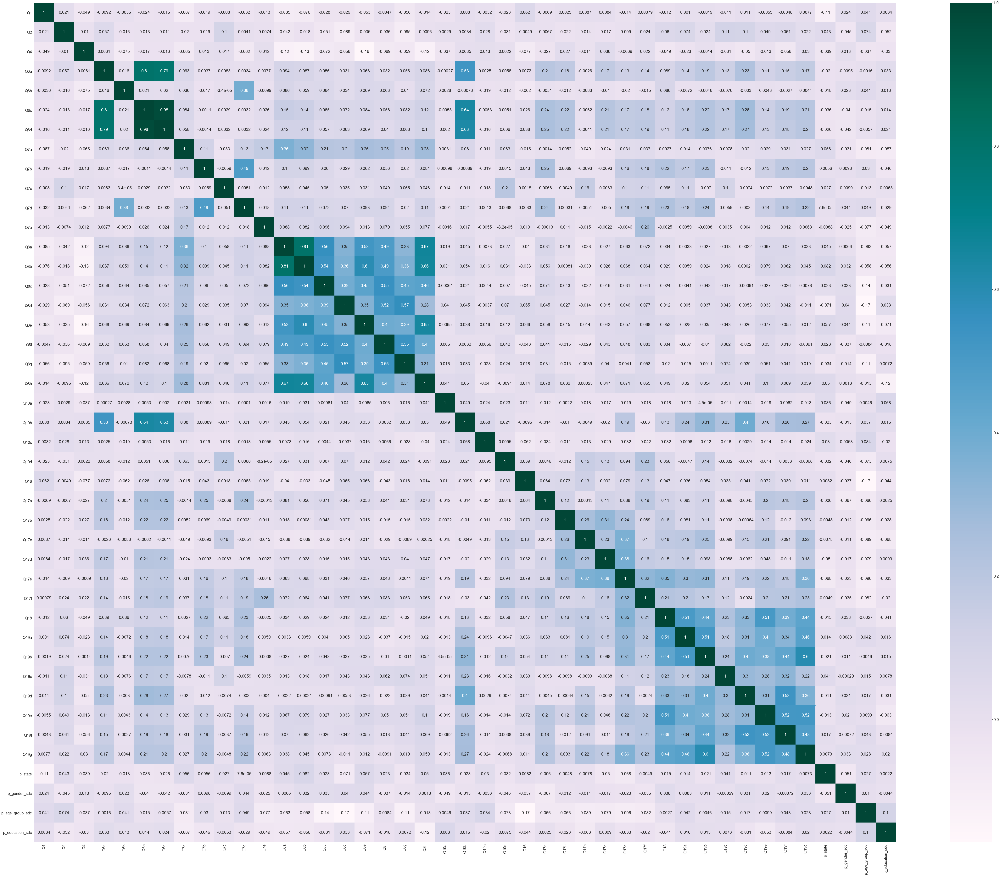

In [127]:
plt.figure(figsize = (100,80))
sns.set(font_scale=1.8)

corr = module_e_cleaned_16.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=True,
           cmap="PuBuGn")
plt.show()

Creating dummy variables 

In [128]:
# One-hot encode the data using pandas get_dummies
features_rf_e16 = pd.get_dummies(module_e_cleaned_16, columns=['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d',\
        'Q18', 'Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e', 'Q19f',
       'Q19g', 'p_state', 'p_gender_sdc', 'p_age_group_sdc',
       'p_education_sdc'], drop_first=False)


In [129]:
features_rf_e16.columns

Index(['Q16', 'Q17a', 'Q17b', 'Q17c', 'Q17d', 'Q17e', 'Q17f', 'Q1_-98', 'Q1_1',
       'Q1_2',
       ...
       'p_state_8', 'p_gender_sdc_1.0', 'p_gender_sdc_2.0',
       'p_age_group_sdc_1.0', 'p_age_group_sdc_2.0', 'p_age_group_sdc_3.0',
       'p_age_group_sdc_4.0', 'p_education_sdc_1.0', 'p_education_sdc_2.0',
       'p_education_sdc_3.0'],
      dtype='object', length=272)

In [130]:
features_rf_e16.iloc[:].head(5)

,Q16,Q17a,Q17b,Q17c,Q17d,Q17e,Q17f,Q1_-98,Q1_1,Q1_2,...,p_state_8,p_gender_sdc_1.0,p_gender_sdc_2.0,p_age_group_sdc_1.0,p_age_group_sdc_2.0,p_age_group_sdc_3.0,p_age_group_sdc_4.0,p_education_sdc_1.0,p_education_sdc_2.0,p_education_sdc_3.0
0,1.0,3.0,3.0,3.0,2.0,3.0,3.0,0,0,1,...,0,0,1,0,0,1,0,1,0,0
5,1.0,3.0,4.0,3.0,3.0,4.0,3.0,0,0,1,...,0,0,1,0,0,1,0,0,1,0
6,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
7,0.0,3.0,3.0,3.0,2.0,3.0,3.0,0,0,1,...,0,1,0,0,0,1,0,0,1,0
10,1.0,3.0,3.0,3.0,3.0,3.0,3.0,0,0,1,...,0,0,1,0,0,1,0,0,1,0


In [131]:
# target are the values we want to predict
target_rf_e16 = np.array(features_rf_e16['Q16'])


In [132]:
# Remove the target and Q17 from the features
# axis 1 refers to the columns
features_rf_e16= features_rf_e16.drop(['Q16','Q17a','Q17b','Q17c','Q17d','Q17e', 'Q17f'], axis = 1)

In [133]:
# Saving feature names for later use
feature_list_rf_e16 = list(features_rf_e16.columns)

In [134]:
# Convert to numpy array
features_rf_e16 = np.array(features_rf_e16)

In [135]:
# Split the data into training and testing sets
train_x, test_x, train_y, test_y = train_test_split(features_rf_e16, target_rf_e16, test_size = 0.30, random_state = 42)

In [136]:
print('Training Features Shape:', train_x.shape)
print('Training Target Shape:', train_y.shape)
print('Testing Features Shape:', test_x.shape)
print('Testing Target Shape:', test_y.shape)

Training Features Shape: (670, 265)
Training Target Shape: (670,)
Testing Features Shape: (288, 265)
Testing Target Shape: (288,)


In [137]:
#Create a RandomForestClassifier
clf_rf_e16=RandomForestClassifier(n_estimators=500,criterion = "gini",random_state = 42)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_rf_e16.fit(train_x,train_y)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [138]:
# Use the forest's predict method on the test data
prediction_y=clf_rf_e16.predict(test_x)

In [139]:
# Calculate the absolute errors
errors = abs(prediction_y - test_y)

In [140]:
confusion_matrix(test_y, prediction_y)

array([[99, 42],
       [66, 81]])

In [141]:
tn, fp, fn, tp = confusion_matrix(test_y, prediction_y).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)


True Positive: 81
False Negative: 66
False Positive: 42
True Negative: 99


In [142]:
# How accurate is the model? 
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(test_y, prediction_y),3)*100,"%")
print("Recall:", recall_score(test_y, prediction_y, average = None))
print("Precision:",precision_score(test_y, prediction_y, average = None))
print("F1 Score:",f1_score(test_y, prediction_y, average = None))

Mean Absolute Error: 37.5 %
Accuracy: 62.5 %
Recall: [0.70212766 0.55102041]
Precision: [0.6        0.65853659]
F1 Score: [0.64705882 0.6       ]


In [143]:
target_names = ['Against','For']

In [144]:
print(classification_report(test_y, prediction_y, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.60      0.70      0.65       141
         For       0.66      0.55      0.60       147

    accuracy                           0.62       288
   macro avg       0.63      0.63      0.62       288
weighted avg       0.63      0.62      0.62       288



Now I would like to evaluate the importance of each feature

In [145]:
feature_imp = pd.Series(clf_rf_e16.feature_importances_,index=feature_list_rf_e16).sort_values(ascending=False)
feature_imp

Q19a_3.0     0.016209
Q4_2         0.015985
Q4_3         0.012997
Q19d_2.0     0.012162
Q18_1.0      0.011992
               ...   
Q10b_-98     0.000017
Q10c_-98     0.000000
Q10d_3       0.000000
p_state_7    0.000000
Q2_7         0.000000
Length: 265, dtype: float64

In [146]:
feature_imp[feature_imp>0]

Q19a_3.0      0.016209
Q4_2          0.015985
Q4_3          0.012997
Q19d_2.0      0.012162
Q18_1.0       0.011992
                ...   
Q6c_-98       0.000044
Q6d_-98       0.000029
Q2_15         0.000028
Q19a_-99.0    0.000026
Q10b_-98      0.000017
Length: 261, dtype: float64

Still too many features with minimal importance. I will just look at any feature with importance > 0.01

### Moving on to evaluate Q18

In [147]:
module_e_cleaned_18 = df_module_e_master

In [148]:
module_e_cleaned_18.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 992 entries, 0 to 2146
Data columns (total 43 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               992 non-null    int64  
 1   Q2               992 non-null    int64  
 2   Q4               992 non-null    int64  
 3   Q6a              992 non-null    int64  
 4   Q6b              992 non-null    int64  
 5   Q6c              992 non-null    int64  
 6   Q6d              992 non-null    int64  
 7   Q7a              992 non-null    int64  
 8   Q7b              992 non-null    int64  
 9   Q7c              992 non-null    int64  
 10  Q7d              992 non-null    int64  
 11  Q7e              992 non-null    int64  
 12  Q8a              992 non-null    float64
 13  Q8b              992 non-null    float64
 14  Q8c              992 non-null    float64
 15  Q8d              992 non-null    float64
 16  Q8e              992 non-null    float64
 17  Q8f            

In [149]:
module_e_cleaned_18.Q18.value_counts()

 3.0     451
 2.0     318
 1.0     123
 4.0      50
-98.0     43
-99.0      7
Name: Q18, dtype: int64

Similar to Q16, I want to exclude non responses

In [150]:
module_e_cleaned_18 = module_e_cleaned_18.loc[(module_e_cleaned_18["Q18"] !=-98.0) & (module_e_cleaned_18["Q18"] !=-99.0)]

In [151]:
module_e_cleaned_18.Q18.value_counts()

3.0    451
2.0    318
1.0    123
4.0     50
Name: Q18, dtype: int64

In [152]:
# Strongly against & Against have been grouped as 0, In favour & Strongly in favour have been grouped as 1
module_e_cleaned_18.Q18 = module_e_cleaned_18.Q18.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1) 

/Users/wtong/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [153]:
module_e_cleaned_18.Q18.value_counts()

1.0    501
0.0    441
Name: Q18, dtype: int64

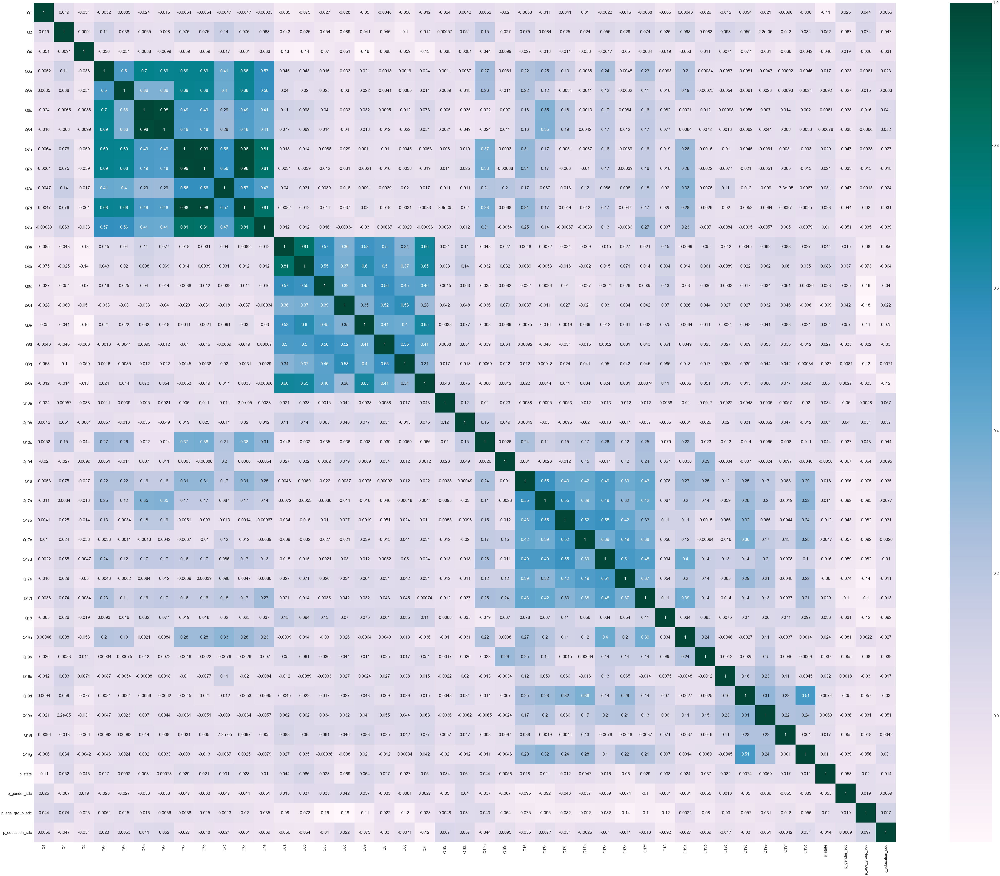

In [154]:
plt.figure(figsize = (100,80))
sns.set(font_scale=1.8)

corr = module_e_cleaned_18.iloc[:].corr()
sns.heatmap(corr,
            xticklabels=corr.columns,
            yticklabels=corr.columns,annot=True,
           cmap="PuBuGn")
plt.show()

In [155]:
module_e_cleaned_18.shape

(942, 43)

### Random Forest

In [156]:
# One-hot encode the data using pandas get_dummies
features_rf_e18 = pd.get_dummies(module_e_cleaned_18, columns=['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d',\
       'Q16','Q17a', 'Q17b', 'Q17c', 'Q17d','Q17e', 'Q17f',\
        'p_state', 'p_gender_sdc', 'p_age_group_sdc',
       'p_education_sdc'], drop_first=False)


In [157]:
features_rf_e18.columns

Index(['Q18', 'Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e', 'Q19f', 'Q19g', 'Q1_-98',
       'Q1_1',
       ...
       'p_state_8', 'p_gender_sdc_1.0', 'p_gender_sdc_2.0',
       'p_age_group_sdc_1.0', 'p_age_group_sdc_2.0', 'p_age_group_sdc_3.0',
       'p_age_group_sdc_4.0', 'p_education_sdc_1.0', 'p_education_sdc_2.0',
       'p_education_sdc_3.0'],
      dtype='object', length=278)

In [158]:
features_rf_e18.iloc[:].head()

,Q18,Q19a,Q19b,Q19c,Q19d,Q19e,Q19f,Q19g,Q1_-98,Q1_1,...,p_state_8,p_gender_sdc_1.0,p_gender_sdc_2.0,p_age_group_sdc_1.0,p_age_group_sdc_2.0,p_age_group_sdc_3.0,p_age_group_sdc_4.0,p_education_sdc_1.0,p_education_sdc_2.0,p_education_sdc_3.0
0,0.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,0,0,...,0,0,1,0,0,1,0,1,0,0
5,0.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,0,0,...,0,0,1,0,0,1,0,0,1,0
6,0.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,0,0,...,0,0,1,0,0,1,0,0,0,1
7,1.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,0,0,...,0,1,0,0,0,1,0,0,1,0
10,1.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,0,0,...,0,0,1,0,0,1,0,0,1,0


In [159]:
target_rf_e18 = np.array(features_rf_e18['Q18'])

In [160]:
# Remove the labels from the features
# axis 1 refers to the columns
features_rf_e18= features_rf_e18.drop(['Q18','Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e', 'Q19f', 'Q19g'], axis = 1)

In [161]:
# Saving feature names for later use
feature_list_rf_e18 = list(features_rf_e18.columns)

In [162]:
# Convert to numpy array
features_rf_e18 = np.array(features_rf_e18)

In [163]:
# Split the data into training and testing sets
train_x, test_x, train_y, test_y = train_test_split(features_rf_e18, target_rf_e18, test_size = 0.30, random_state = 42)

In [164]:
print('Training Features Shape:', train_x.shape)
print('Training Target Shape:', train_y.shape)
print('Testing Features Shape:', test_x.shape)
print('Testing Target Shape:', test_y.shape)

Training Features Shape: (659, 270)
Training Target Shape: (659,)
Testing Features Shape: (283, 270)
Testing Target Shape: (283,)


In [165]:
#Create a RandomForestClassifier Classifier
clf_rf_e18=RandomForestClassifier(n_estimators=500,criterion = "gini",random_state = 42)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_rf_e18.fit(train_x,train_y)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [166]:
# Use the forest's predict method on the test data
prediction_y=clf_rf_e18.predict(test_x)

In [167]:
confusion_matrix(test_y, prediction_y)

array([[ 76,  66],
       [ 40, 101]])

In [168]:
tn, fp, fn, tp = confusion_matrix(test_y, prediction_y).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)


True Positive: 101
False Negative: 40
False Positive: 66
True Negative: 76


In [169]:
# Calculate the absolute errors
errors = abs(prediction_y - test_y)

In [170]:
# How accurate is the model? 
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(test_y, prediction_y),3)*100,"%")
print("Recall:", recall_score(test_y, prediction_y, average = None))
print("Precision:",precision_score(test_y, prediction_y, average = None))
print("F1 Score:",f1_score(test_y, prediction_y, average = None))

Mean Absolute Error: 37.5 %
Accuracy: 62.5 %
Recall: [0.53521127 0.71631206]
Precision: [0.65517241 0.60479042]
F1 Score: [0.58914729 0.65584416]


In [171]:
target_names = ['Against','For']

In [172]:
print(classification_report(test_y, prediction_y, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.66      0.54      0.59       142
         For       0.60      0.72      0.66       141

    accuracy                           0.63       283
   macro avg       0.63      0.63      0.62       283
weighted avg       0.63      0.63      0.62       283



Now I would like to evalaute the importance of each feature

In [173]:
feature_imp = pd.Series(clf_rf_e18.feature_importances_,index=feature_list_rf_e18).sort_values(ascending=False)
feature_imp

Q17b_3.0      0.018249
Q17b_2.0      0.014142
Q17b_1.0      0.011059
Q6c_4         0.010180
Q10c_5        0.009696
                ...   
Q7c_-99       0.000000
Q7d_-99       0.000000
Q17a_-99.0    0.000000
Q7a_-99       0.000000
Q6a_-99       0.000000
Length: 270, dtype: float64

In [174]:
feature_imp[feature_imp>0]

Q17b_3.0    0.018249
Q17b_2.0    0.014142
Q17b_1.0    0.011059
Q6c_4       0.010180
Q10c_5      0.009696
              ...   
Q7e_-98     0.000029
Q6a_-98     0.000028
Q7b_-98     0.000024
Q6c_-98     0.000020
Q6d_-98     0.000018
Length: 254, dtype: float64

In [175]:
feature_imp[feature_imp>0.01]

Q17b_3.0    0.018249
Q17b_2.0    0.014142
Q17b_1.0    0.011059
Q6c_4       0.010180
dtype: float64

##  Cluster analysis using Kmodes

In [176]:
e_cluster = df_module_e_master

In [177]:
e_cluster.Q16.value_counts()

 3.0     360
 2.0     336
 1.0     156
 4.0     106
-98.0     33
-99.0      1
Name: Q16, dtype: int64

In [178]:
e_cluster = e_cluster.loc[(e_cluster["Q16"] !=-98.0) & (e_cluster["Q16"] !=-99.0)]

In [179]:
e_cluster.Q18.value_counts()

 3.0     445
 2.0     307
 1.0     120
 4.0      50
-98.0     29
-99.0      7
Name: Q18, dtype: int64

In [180]:
e_cluster = e_cluster.loc[(e_cluster["Q18"] !=-98.0) & (e_cluster["Q18"] !=-99.0)]

In [181]:
# Strongly against & Against have been grouped as 0, In favour & Strongly in favour have been grouped as 1
e_cluster.Q16 = e_cluster.Q16.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1) 

In [182]:
# Strongly against & Against have been grouped as 0, In favour & Strongly in favour have been grouped as 1
e_cluster.Q18 = e_cluster.Q18.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1) 

In [183]:
# One-hot encode the data using pandas get_dummies
e_cluster_a = pd.get_dummies(e_cluster, columns=['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b', 'Q7c',
       'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g', 'Q8h',
       'Q10a', 'Q10b', 'Q10c', 'Q10d',\
       'Q16','Q17a', 'Q17b', 'Q17c', 'Q17d','Q17e', 'Q17f',\
     'Q18', 'Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e', 'Q19f','Q19g',
        'p_state', 'p_gender_sdc', 'p_age_group_sdc',
       'p_education_sdc'], drop_first=False)


In [184]:
e_cluster_a.columns

Index(['Q1_-98', 'Q1_1', 'Q1_2', 'Q1_3', 'Q1_4', 'Q1_5', 'Q2_-99', 'Q2_-98',
       'Q2_-96', 'Q2_1',
       ...
       'p_state_8', 'p_gender_sdc_1.0', 'p_gender_sdc_2.0',
       'p_age_group_sdc_1.0', 'p_age_group_sdc_2.0', 'p_age_group_sdc_3.0',
       'p_age_group_sdc_4.0', 'p_education_sdc_1.0', 'p_education_sdc_2.0',
       'p_education_sdc_3.0'],
      dtype='object', length=289)

In [185]:
cost = []
# I will start with 10 clusters
for num_clusters in list(range(1,11)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 1, verbose=1)
    clusters = kmode.fit_predict(e_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 38472.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 209, cost: 36208.0
Run 1, iteration: 2/100, moves: 55, cost: 36194.0
Run 1, iteration: 3/100, moves: 0, cost: 36194.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 258, cost: 35507.0
Run 1, iteration: 2/100, moves: 110, cost: 35392.0
Run 1, iteration: 3/100, moves: 49, cost: 35392.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 250, cost: 34671.0
Run 1, iteration: 2/100, moves: 94, cost: 34632.0
Run 1, iteration: 3/100, moves: 3, cost: 34632.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 287, cost: 34198.0
Run 1, iteration: 2/100, moves: 136, cost: 34086

Text(0.5, 1.0, 'Elbow Method')

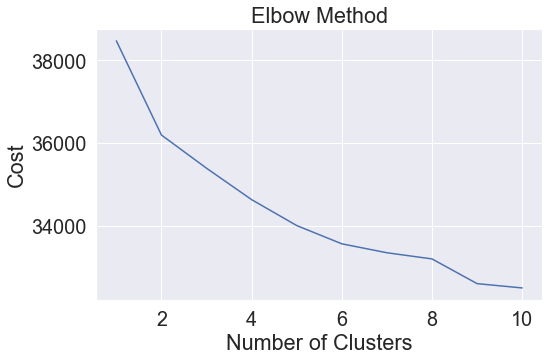

In [186]:
number_k = np.array([i for i in range(1,11)])

plt.figure(figsize = (8,5))
plt.plot(number_k,cost)
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.title('Elbow Method')

It seems like 4 clusters suit this model best

In [187]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in e_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q10d_2
Q16_1.0
Q17a_3.0
Q17b_3.0
Q17c_3.0
Q17d_3.0
Q17e_3.0
Q17f_3.0
Q18_1.0
Q19a_3.0
Q19b_3.0
Q19c_2.0
Q19d_3.0
Q19e_3.0
Q19f_3.0
Q19g_3.0
p_gender_sdc_2.0
p_education_sdc_1.0

cluster 1: 
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8c_1.0
Q8d_1.0
Q8f_1.0
Q8g_1.0
Q10d_1
Q16_0.0
Q17d_1.0
Q18_0.0
Q19a_1.0
Q19c_1.0
p_gender_sdc_1.0
p_education_sdc_1.0

cluster 2: 
Q1_2
Q4_2
Q6c_4
Q16_0.0
Q17a_1.0
Q17b_1.0
Q17d_1.0
Q17f_1.0
Q18_1.0
Q19d_3.0
Q19e_4.0
Q19f_4.0
Q19g_4.0
p_gender_sdc_1.0
p_education_sdc_1.0

cluster 3: 
Q6b_2
Q6c_2
Q6d_2
Q7a_2
Q7b_2
Q7c_2
Q16_0.0
Q17a_2.0
Q17b_2.0
Q17d_2.0
Q17f_2.0
Q18_0.0
Q19a_2.0
Q19b_2.0
Q19c_2.0
Q19d_3.0
Q19e_3.0
Q19f_3.0
Q19g_3.0
p_gender_sdc_1.0

cluster 4: 
Q1_2
Q7a_2
Q7b_2
Q7c_2
Q7e_2
Q10d_2
Q16_1.0
Q17a_3.0
Q17b_3.0
Q17c_3.0
Q17d_3.0
Q17e_3.0
Q17f_3.0
Q18_0.0
Q19a_2.0
Q19b_2.0
Q19c_2.0
Q19d_3.0
Q19e_2.0
Q19f_2.0
Q19g_3.0
p_gender_sdc_1.0

cluster 5: 
Q1_4
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8d_1.0
Q10d_1
Q16_1.0
Q17a_3.0
Q17b_3.0
Q17c_3

In [188]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(e_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)


For n_clusters = 10 The average silhouette_score is : 0.018421052545839776


Although the silhouette score is not negative, it is still rather close to zero. Let's check if changin the number of clusters will improve the score.

### In my second iteration, I will set number of clusters to 4 instead based on result from elbow method.

In [189]:
cost = []
for num_clusters in list(range(1,5)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 10, verbose=1)
    clusters = kmode.fit_predict(e_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 38472.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 209, cost: 36208.0
Run 1, iteration: 2/100, moves: 55, cost: 36194.0
Run 1, iteration: 3/100, moves: 0, cost: 36194.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 258, cost: 35507.0
Run 1, iteration: 2/100, moves: 110, cost: 35392.0
Run 1, iteration: 3/100, moves: 49, cost: 35392.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, 

In [190]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in e_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q16_1.0
Q17a_3.0
Q17b_3.0
Q17c_3.0
Q17e_3.0
Q17f_3.0
Q18_1.0
Q19a_3.0
Q19b_3.0
Q19c_2.0
Q19d_3.0
Q19e_3.0
Q19f_3.0
Q19g_3.0
p_gender_sdc_2.0

cluster 1: 
Q7a_1
Q7b_1
Q7c_1
Q7d_1
Q7e_1
Q8d_1.0
Q8f_1.0
Q8g_1.0
Q10d_1
Q16_0.0
Q18_0.0
Q19c_1.0
Q19d_3.0
p_gender_sdc_1.0

cluster 2: 
Q1_2
Q4_2
Q6c_4
Q16_0.0
Q17a_1.0
Q17d_1.0
Q18_1.0
Q19f_4.0
p_gender_sdc_1.0
p_education_sdc_1.0

cluster 3: 
Q1_2
Q7a_2
Q7b_2
Q7c_2
Q7e_2
Q10d_2
Q16_0.0
Q17a_2.0
Q17b_2.0
Q17c_3.0
Q17d_2.0
Q17f_2.0
Q18_0.0
Q19a_2.0
Q19c_2.0
Q19d_3.0
Q19e_3.0
Q19f_3.0
Q19g_3.0
p_gender_sdc_2.0


In [191]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(e_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)



For n_clusters = 4 The average silhouette_score is : 0.028244121906413726


The silouette score improved after we reduced the number of clusters from 10 to 4 at the recommendation of elbow method. The low score is probably due to the high sparsity in data. I want to reduce the number of clusters to 2 and see what result do I get.

In [192]:
cost = []
# Setting k to 2
for num_clusters in list(range(1,3)):
    kmode = KModes(n_clusters=num_clusters, init = "Cao", n_init = 10, verbose=1)
    clusters = kmode.fit_predict(d_cluster_a)
    kmodes = kmode.cluster_centroids_
    shape = kmodes.shape
    cost.append(kmode.cost_)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 27636.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 167, cost: 26108.0


In [193]:
for i in range(shape[0]):
    if sum(kmodes[i,:]) == 0:
        print("\ncluster " + str(i) + ": ")
        print("no-similarity cluster")
    else:
        print("\ncluster " + str(i) + ": ")
        cent = kmodes[i,:]
        for j in d_cluster_a.columns[np.nonzero(cent)]:
            print(j)


cluster 0: 
Q1_2
Q10b_4
Q10c_4
Q11_1.0
Q13a_1.0
Q13b_1.0
Q13c_2.0
Q13d_1.0
Q13e_2.0
Q13f_2.0
Q15_3.0
p_gender_sdc_2.0
p_education_sdc_1.0

cluster 1: 
Q11_1.0
Q13a_1.0
Q13b_2.0
Q13c_1.0
Q13d_1.0
Q13e_1.0
Q13f_1.0
Q12_2.0
p_gender_sdc_1.0


In [194]:
# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the compactness and separation of the formed
# clusters
silhouette_avg = silhouette_score(d_cluster_a, clusters)
print("For n_clusters =", num_clusters,
          "The average silhouette_score is :", silhouette_avg)



For n_clusters = 2 The average silhouette_score is : 0.030981578979599012


Interestingly, after reducing the number of clusters from 4 to 3, the silhouette score drops. Additionally, Cluster `1` with only one independent variable does not make much sense or provide much insight. 

> Given this result, setting number of clusters to `4` is the best option.

### Naive Bayes

#### First I will start with using Q16 as the target variable

In [195]:
# I only selected the varialbes that I found more relevant for the dataset
df_e_nb = df_module_e_master

In [196]:
df_e_nb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 992 entries, 0 to 2146
Data columns (total 43 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Q1               992 non-null    int64  
 1   Q2               992 non-null    int64  
 2   Q4               992 non-null    int64  
 3   Q6a              992 non-null    int64  
 4   Q6b              992 non-null    int64  
 5   Q6c              992 non-null    int64  
 6   Q6d              992 non-null    int64  
 7   Q7a              992 non-null    int64  
 8   Q7b              992 non-null    int64  
 9   Q7c              992 non-null    int64  
 10  Q7d              992 non-null    int64  
 11  Q7e              992 non-null    int64  
 12  Q8a              992 non-null    float64
 13  Q8b              992 non-null    float64
 14  Q8c              992 non-null    float64
 15  Q8d              992 non-null    float64
 16  Q8e              992 non-null    float64
 17  Q8f            

In [197]:
df_e_nb_16 = df_e_nb.apply(lambda x:abs(x))

In [198]:
df_e_nb_16.Q16.value_counts()

3.0     360
2.0     336
1.0     156
4.0     106
98.0     33
99.0      1
Name: Q16, dtype: int64

In [199]:
df_e_nb_16 = df_e_nb_16.loc[(df_e_nb_16["Q16"] !=98.0) & (df_e_nb_16["Q16"] !=99.0)]

In [200]:
df_e_nb_16.Q16.value_counts()

3.0    360
2.0    336
1.0    156
4.0    106
Name: Q16, dtype: int64

In [201]:
# Grouping up Strongly against and Against to `0` and In favour and Strongly in favour to `1`
df_e_nb_16.Q16 = df_e_nb_16.Q16.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1)

In [202]:
df_e_nb_16.Q16.value_counts()

0.0    492
1.0    466
Name: Q16, dtype: int64

I also want to exclude Q17a-g because I already knew they have a stronger correlation with Q16.

In [203]:
features_e_nb_16 = df_e_nb_16[['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b',
                    'Q7c', 'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g',
                    'Q8h', 'Q10a', 'Q10b', 'Q10c', 'Q10d',
                    'Q18', 'Q19a', 'Q19b', 'Q19c', 'Q19d', 'Q19e',
                    'Q19f', 'Q19g', 'p_state', 'p_gender_sdc', 'p_age_group_sdc',
                    'p_education_sdc'
            ]] 

In [204]:
target_e_nb_16 = df_e_nb_16['Q16'] 

In [205]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_16, target_e_nb_16, test_size=0.30, random_state=42)

In [206]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [207]:
prediction_nb = model_nb.predict(X_test)

In [208]:
errors = abs(prediction_nb - y_test)

In [209]:
confusion_matrix(y_test, prediction_nb)

array([[ 23, 118],
       [ 24, 123]])

In [210]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 123
False Negative: 24
False Positive: 118
True Negative: 23


In [211]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 49.3 %
Accuracy: 50.7 %
Recall: [0.16312057 0.83673469]
Precision: [0.4893617  0.51037344]
F1 Score: [0.24468085 0.63402062]


In [212]:
target_names=['Against','In favour']

In [213]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.49      0.16      0.24       141
   In favour       0.51      0.84      0.63       147

    accuracy                           0.51       288
   macro avg       0.50      0.50      0.44       288
weighted avg       0.50      0.51      0.44       288



The accruacy rate is quite low, only `51%`. Let me remove opinions on privacy and see if the score improves.

### Second iteration on Module E, Q16 - removing opinions on privacy concerns. 

In [214]:
features_e_nb_16a = df_e_nb_16[['Q1', 'Q2', 'Q4', 
                   'p_state', 'p_gender_sdc', 'p_age_group_sdc',
                    'p_education_sdc'
            ]] 

In [215]:
target_e_nb_16a = df_e_nb_16['Q16'] 

In [216]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_16a, target_e_nb_16a, test_size=0.30, random_state=42)

In [217]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [218]:
prediction_nb = model_nb.predict(X_test)

In [219]:
errors = abs(prediction_nb - y_test)

In [220]:
confusion_matrix(y_test, prediction_nb)

array([[75, 66],
       [52, 95]])

In [221]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 95
False Negative: 52
False Positive: 66
True Negative: 75


In [222]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 41.0 %
Accuracy: 59.0 %
Recall: [0.53191489 0.6462585 ]
Precision: [0.59055118 0.59006211]
F1 Score: [0.55970149 0.61688312]


In [223]:
target_names=['Against','In favour']

In [224]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.59      0.53      0.56       141
   In favour       0.59      0.65      0.62       147

    accuracy                           0.59       288
   macro avg       0.59      0.59      0.59       288
weighted avg       0.59      0.59      0.59       288



The accruacy rate is better than before.

### Third iteration - using opinions on privacy as features

In [225]:
features_e_nb_16b = df_e_nb_16[['Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b',
                    'Q7c', 'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g',
                    'Q8h', 'Q10a', 'Q10b', 'Q10c', 'Q10d'
            ]] 

In [226]:
target_e_nb_16b = df_e_nb_16['Q16'] 

In [227]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_16b, target_e_nb_16b, test_size=0.30, random_state=42)

In [228]:
model_nb = MultinomialNB().fit(X_train, y_train)

In [229]:
prediction_nb = model_nb.predict(X_test)

In [230]:
errors = abs(prediction_nb - y_test)

In [231]:
confusion_matrix(y_test, prediction_nb)

array([[73, 68],
       [59, 88]])

In [232]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 88
False Negative: 59
False Positive: 68
True Negative: 73


In [233]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 44.1 %
Accuracy: 55.900000000000006 %
Recall: [0.5177305  0.59863946]
Precision: [0.5530303  0.56410256]
F1 Score: [0.53479853 0.58085809]


In [234]:
target_names=['Against','In favour']

In [235]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.55      0.52      0.53       141
   In favour       0.56      0.60      0.58       147

    accuracy                           0.56       288
   macro avg       0.56      0.56      0.56       288
weighted avg       0.56      0.56      0.56       288



The accuracy rate improves marginally but it is nowhere close to `70%` (the accuract rate that I want). Maybe Naive Bayes is not a very suitable model for this dataset.

### Naive Bayes on Module E, Q18 as the target variable 

In [236]:
df_e_nb_18 = df_module_e_master

In [237]:
df_e_nb_18 = df_e_nb_18.apply(lambda x:abs(x))

In [238]:
df_e_nb_18.Q18.value_counts()

3.0     451
2.0     318
1.0     123
4.0      50
98.0     43
99.0      7
Name: Q18, dtype: int64

In [239]:
df_e_nb_18 = df_e_nb_18.loc[(df_e_nb_18["Q18"] !=98.0) & (df_e_nb_18["Q18"] !=99.0)]

In [240]:
df_e_nb_18.Q18.value_counts()

3.0    451
2.0    318
1.0    123
4.0     50
Name: Q18, dtype: int64

In [241]:
# Grouping up Strongly against and Against to `0` and In favour and Strongly in favour to `1`
df_e_nb_18.Q18 = df_e_nb_18.Q18.replace(1.0,0).replace(2.0,0).replace(3.0,1).replace(4.0,1)

In [242]:
df_e_nb_18.Q18.value_counts()

1.0    501
0.0    441
Name: Q18, dtype: int64

In [243]:
# I exclude Q19a-g as I know these questions have a high correlation with Q18.
features_e_nb_18 = df_e_nb_18[['Q1', 'Q2', 'Q4', 'Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b',
                    'Q7c', 'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g',
                    'Q8h', 'Q10a', 'Q10b', 'Q10c', 'Q10d', 'Q16', 'Q17a', 'Q17b', 'Q17c',
                    'Q17d', 'Q17e', 'Q17f', 'p_state', 'p_gender_sdc', 'p_age_group_sdc',
                    'p_education_sdc'
            ]] 

In [244]:
target_e_nb_18 = df_e_nb_18['Q18'] 

In [245]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_18, target_e_nb_18, test_size=0.30, random_state=42)
model_nb = MultinomialNB().fit(X_train, y_train)
prediction_nb = model_nb.predict(X_test)
errors = abs(prediction_nb - y_test)

In [246]:
confusion_matrix(y_test, prediction_nb)

array([[ 47,  95],
       [ 33, 108]])

In [247]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 108
False Negative: 33
False Positive: 95
True Negative: 47


In [248]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 45.2 %
Accuracy: 54.800000000000004 %
Recall: [0.33098592 0.76595745]
Precision: [0.5875    0.5320197]
F1 Score: [0.42342342 0.62790698]


In [249]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.59      0.33      0.42       142
   In favour       0.53      0.77      0.63       141

    accuracy                           0.55       283
   macro avg       0.56      0.55      0.53       283
weighted avg       0.56      0.55      0.53       283



The accruacy rate is only `55%` and is rather low. Now I will only look at general opinions and demographic info in my second iteration 

### Second iteration - general opinions and demographic info.

In [250]:
features_e_nb_18a = df_e_nb_18[['Q1', 'Q2', 'Q4', 'p_state', 'p_gender_sdc', 'p_age_group_sdc',
                    'p_education_sdc'
            ]] 

In [251]:
target_e_nb_18a = df_e_nb_18['Q18'] 

In [252]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_18a, target_e_nb_18a, test_size=0.30, random_state=42)
model_nb = MultinomialNB().fit(X_train, y_train)
errors = abs(prediction_nb - y_test)
prediction_nb = model_nb.predict(X_test)

In [253]:
confusion_matrix(y_test, prediction_nb)

array([[ 31, 111],
       [ 35, 106]])

In [254]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 106
False Negative: 35
False Positive: 111
True Negative: 31


In [255]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 45.2 %
Accuracy: 48.4 %
Recall: [0.21830986 0.75177305]
Precision: [0.46969697 0.48847926]
F1 Score: [0.29807692 0.59217877]


In [256]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.47      0.22      0.30       142
   In favour       0.49      0.75      0.59       141

    accuracy                           0.48       283
   macro avg       0.48      0.49      0.45       283
weighted avg       0.48      0.48      0.44       283



Accuracy is worse than before. Now I will look at privacy concerns instead. 

### Third iteration - privacy concerns on Q18

In [257]:
features_e_nb_18b = df_e_nb_18[['Q6a', 'Q6b', 'Q6c', 'Q6d', 'Q7a', 'Q7b',
                    'Q7c', 'Q7d', 'Q7e', 'Q8a', 'Q8b', 'Q8c', 'Q8d', 'Q8e', 'Q8f', 'Q8g',
                    'Q8h', 'Q10a', 'Q10b', 'Q10c', 'Q10d'
            ]] 

In [258]:
target_e_nb_18b = df_e_nb_18['Q18'] 

In [259]:
X_train, X_test, y_train, y_test = train_test_split(features_e_nb_18b, target_e_nb_18b, test_size=0.30, random_state=42)
model_nb = MultinomialNB().fit(X_train, y_train)
errors = abs(prediction_nb - y_test)
prediction_nb = model_nb.predict(X_test)

In [260]:
confusion_matrix(y_test, prediction_nb)

array([[56, 86],
       [55, 86]])

In [261]:
tn, fp, fn, tp = confusion_matrix(y_test, prediction_nb).ravel()
print("True Positive:", tp)
print("False Negative:", fn)
print("False Positive:", fp)
print("True Negative:", tn)

True Positive: 86
False Negative: 55
False Positive: 86
True Negative: 56


In [262]:
# How accurate is this model?
print('Mean Absolute Error:', round(np.mean(errors), 3)*100, '%')
print("Accuracy:",round(accuracy_score(y_test, prediction_nb),3)*100,"%")
print("Recall:", recall_score(y_test, prediction_nb, average = None))
print("Precision:",precision_score(y_test, prediction_nb, average = None))
print("F1 Score:",f1_score(y_test, prediction_nb, average=None))

Mean Absolute Error: 51.6 %
Accuracy: 50.2 %
Recall: [0.3943662  0.60992908]
Precision: [0.5045045 0.5      ]
F1 Score: [0.44268775 0.54952077]


In [263]:
print(classification_report(y_test, prediction_nb, target_names=target_names))

              precision    recall  f1-score   support

     Against       0.50      0.39      0.44       142
   In favour       0.50      0.61      0.55       141

    accuracy                           0.50       283
   macro avg       0.50      0.50      0.50       283
weighted avg       0.50      0.50      0.50       283



The accuracy score is still rather low after 3 attempts to improve the model. It appears that Naive Bayes might not be the best cadidate for this dataset.